# Importing libraries

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [50]:
from ultralytics import YOLO
import os
import locale
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch
from google.colab.patches import cv2_imshow

# Change encoding to be compatible with YOLO

In [12]:
os.environ["LC_ALL"] = "en_US.UTF-8"
os.environ["LANG"] = "en_US.UTF-8"

print(locale.getpreferredencoding())

ANSI_X3.4-1968


# Loading the dataset

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Create a YOLOv10s model and train it on the labelled characters

In [6]:
# Load a model
model = YOLO('yolov10s.pt')

100%|██████████| 15.9M/15.9M [00:00<00:00, 117MB/s] 


In [7]:
# Train the model
model.train(data='/content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/data.yaml',
            epochs=100, imgsz=640, batch=16, name='yolov10-custom')

Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov10s.pt, data=/content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov10-custom, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, 

100%|██████████| 755k/755k [00:00<00:00, 45.1MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1     36096  ultralytics.nn.modules.block.SCDown          [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1    137728  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 174MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/train/labels.cache... 380 images, 76 backgrounds, 0 corrupt: 100%|██████████| 380/380 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/valid/labels.cache... 103 images, 13 backgrounds, 0 corrupt: 100%|██████████| 103/103 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov10-custom/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov10-custom
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.74G      2.587      12.93      3.172         29        640: 100%|██████████| 24/24 [00:14<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]

                   all        103        125      0.388      0.493      0.337      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.69G      2.694      5.753      3.055         24        640: 100%|██████████| 24/24 [00:10<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all        103        125     0.0147      0.233    0.00944    0.00386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.69G      3.001      4.282      3.203         38        640: 100%|██████████| 24/24 [00:09<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.01it/s]

                   all        103        125      0.188     0.0788     0.0336     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.68G       3.14      4.024      3.315         23        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]

                   all        103        125        0.5      0.142      0.156     0.0602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.84G      3.161      3.899      3.232         27        640: 100%|██████████| 24/24 [00:12<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]

                   all        103        125      0.119      0.224      0.073     0.0188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.84G      3.134      3.727      3.209         29        640: 100%|██████████| 24/24 [00:09<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all        103        125      0.157      0.182     0.0683     0.0276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.68G      3.085       3.66      3.245         27        640: 100%|██████████| 24/24 [00:09<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.92it/s]


                   all        103        125     0.0132     0.0862    0.00818    0.00189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.84G      2.962      3.275      3.103         31        640: 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]

                   all        103        125      0.338        0.3      0.281      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.84G      2.923      3.006      3.066         31        640: 100%|██████████| 24/24 [00:12<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]


                   all        103        125      0.275      0.204      0.256      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.84G      2.852      2.908      2.953         30        640: 100%|██████████| 24/24 [00:10<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]

                   all        103        125      0.517      0.295      0.363      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.84G      2.812      3.037      3.013         32        640: 100%|██████████| 24/24 [00:09<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.02it/s]

                   all        103        125      0.287      0.396      0.272      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.84G      2.732      2.909      2.982         29        640: 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]


                   all        103        125      0.413       0.39      0.376      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.84G      2.706      2.835       2.92         22        640: 100%|██████████| 24/24 [00:12<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        103        125      0.392       0.55      0.465      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.84G      2.744      2.915      2.965         27        640: 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.58it/s]

                   all        103        125      0.629       0.48      0.555      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.84G      2.669      2.935      2.931         42        640: 100%|██████████| 24/24 [00:09<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        103        125      0.331       0.43      0.329      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.84G      2.639      2.682      2.916         32        640: 100%|██████████| 24/24 [00:11<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        103        125      0.614      0.506      0.564      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.84G      2.629      2.492       2.85         26        640: 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.52it/s]

                   all        103        125      0.851       0.58      0.729      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.84G      2.616      2.553      2.872         24        640: 100%|██████████| 24/24 [00:10<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all        103        125      0.609      0.655      0.659      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.68G      2.504      2.506      2.771         30        640: 100%|██████████| 24/24 [00:09<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.02it/s]

                   all        103        125      0.711      0.453      0.592      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.68G      2.491      2.562      2.801         19        640: 100%|██████████| 24/24 [00:11<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]

                   all        103        125      0.693      0.533      0.652      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       5.7G      2.449      2.353      2.792         20        640: 100%|██████████| 24/24 [00:12<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]

                   all        103        125      0.624      0.556      0.664      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.84G      2.475      2.365       2.78         34        640: 100%|██████████| 24/24 [00:10<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.57it/s]

                   all        103        125      0.632       0.72      0.701      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.84G      2.482      2.335      2.766         28        640: 100%|██████████| 24/24 [00:09<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]

                   all        103        125      0.653       0.76       0.73      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.84G      2.378      2.204      2.667         30        640: 100%|██████████| 24/24 [00:11<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.93it/s]

                   all        103        125      0.733      0.628      0.719      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.84G      2.328      2.229      2.676         37        640: 100%|██████████| 24/24 [00:12<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        103        125      0.727      0.707       0.74      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.84G      2.449      2.265      2.738         26        640: 100%|██████████| 24/24 [00:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]

                   all        103        125      0.746      0.724      0.763      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.84G      2.332      2.207       2.65         34        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all        103        125      0.758      0.671      0.758      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.86G       2.35      2.196      2.667         26        640: 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.90it/s]

                   all        103        125      0.861      0.691      0.801      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.68G      2.137      1.849      2.572         27        640: 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]

                   all        103        125      0.741      0.639      0.763      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       5.7G      2.202      2.041       2.56         37        640: 100%|██████████| 24/24 [00:11<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]


                   all        103        125      0.784      0.759      0.791      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.84G      2.309      2.107      2.662         30        640: 100%|██████████| 24/24 [00:09<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]

                   all        103        125      0.781      0.667      0.775       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.68G      2.174      2.012      2.628         29        640: 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.91it/s]

                   all        103        125       0.74      0.724      0.794      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.84G      2.148       1.96      2.553         19        640: 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        103        125      0.849      0.655      0.807      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.84G      2.193      2.023      2.591         22        640: 100%|██████████| 24/24 [00:11<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        103        125      0.791       0.71      0.748      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.84G      2.153      1.878      2.573         20        640: 100%|██████████| 24/24 [00:10<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        103        125      0.856       0.72      0.811      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.84G      2.185      1.936      2.569         23        640: 100%|██████████| 24/24 [00:10<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.91it/s]

                   all        103        125      0.883       0.67      0.811      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.68G      2.069       1.81      2.506         17        640: 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        103        125      0.715      0.793      0.757      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.84G      2.072      1.763      2.522         26        640: 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all        103        125      0.681      0.839      0.778      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.68G      2.164      1.758      2.562         20        640: 100%|██████████| 24/24 [00:10<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]

                   all        103        125       0.79      0.812      0.818      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.68G      2.071      1.737      2.513         33        640: 100%|██████████| 24/24 [00:09<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        103        125      0.783      0.769      0.812      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.84G      1.969      1.772      2.477         17        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]

                   all        103        125      0.756      0.796      0.827      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       5.7G       2.06      1.739      2.502         22        640: 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]

                   all        103        125      0.809      0.773       0.82      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.86G      2.072      1.726      2.507         37        640: 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        103        125      0.776      0.772      0.819      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.68G      1.913      1.641      2.459         21        640: 100%|██████████| 24/24 [00:09<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all        103        125      0.778      0.854      0.858      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.68G       2.01      1.654      2.428         19        640: 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.96it/s]

                   all        103        125      0.869      0.733      0.852      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.68G      2.111      1.675      2.499         22        640: 100%|██████████| 24/24 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all        103        125      0.827      0.796      0.853      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.68G      1.942       1.58      2.404         20        640: 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]

                   all        103        125      0.841       0.83      0.869      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.84G      1.991      1.621      2.455         23        640: 100%|██████████| 24/24 [00:09<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        103        125      0.826      0.776      0.837      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.68G      1.987      1.674      2.503         25        640: 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.00it/s]

                   all        103        125      0.748      0.846      0.842      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.68G       1.96      1.588       2.43         32        640: 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        103        125      0.854      0.747      0.821      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.68G      1.929      1.598      2.417         28        640: 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        103        125      0.769      0.804      0.819      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.84G      1.929      1.589      2.394         29        640: 100%|██████████| 24/24 [00:09<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]

                   all        103        125      0.853      0.784      0.845      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100       5.7G      1.883      1.512       2.37         21        640: 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]

                   all        103        125      0.904      0.769      0.878      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.84G       1.89      1.471      2.388         34        640: 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]

                   all        103        125      0.847      0.768       0.86      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.68G      1.813      1.498      2.339         39        640: 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]


                   all        103        125      0.871        0.8      0.882       0.64

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.84G      1.816      1.426      2.375         25        640: 100%|██████████| 24/24 [00:09<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        103        125      0.823      0.804      0.854        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.84G      1.865      1.473      2.369         36        640: 100%|██████████| 24/24 [00:10<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.96it/s]

                   all        103        125      0.786      0.836      0.851      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.84G      1.848      1.514      2.361         26        640: 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        103        125      0.854      0.831      0.888      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.84G      1.843      1.471       2.34         22        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        103        125      0.872      0.812        0.9      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.84G      1.785      1.372      2.369         20        640: 100%|██████████| 24/24 [00:09<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]


                   all        103        125      0.819      0.827      0.866       0.61

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.84G      1.853      1.391      2.388         18        640: 100%|██████████| 24/24 [00:10<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.05it/s]

                   all        103        125      0.841      0.862      0.875      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.84G      1.742      1.309      2.312         28        640: 100%|██████████| 24/24 [00:12<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.93it/s]

                   all        103        125      0.878      0.851      0.883      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.84G      1.803      1.308      2.328         31        640: 100%|██████████| 24/24 [00:11<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        103        125      0.893      0.791      0.872      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.68G      1.793      1.359      2.333         26        640: 100%|██████████| 24/24 [00:09<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all        103        125      0.884      0.796      0.878      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.68G      1.752      1.326      2.318         28        640: 100%|██████████| 24/24 [00:10<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]

                   all        103        125      0.833      0.846      0.846      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.84G      1.762      1.392      2.323         21        640: 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]

                   all        103        125      0.892       0.79      0.859      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.68G      1.673       1.36      2.281         36        640: 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all        103        125      0.775      0.811       0.84      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.68G      1.806      1.357      2.337         32        640: 100%|██████████| 24/24 [00:09<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        103        125      0.919      0.797      0.883      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.68G      1.693      1.302      2.302         36        640: 100%|██████████| 24/24 [00:10<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]

                   all        103        125      0.908      0.833      0.888      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       5.7G      1.696       1.33      2.293         26        640: 100%|██████████| 24/24 [00:12<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        103        125      0.809      0.819      0.847      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.86G      1.691        1.3      2.307         19        640: 100%|██████████| 24/24 [00:12<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        103        125      0.808      0.859      0.875      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.68G      1.684      1.341      2.328         29        640: 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]

                   all        103        125      0.854      0.873      0.895      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.84G      1.639      1.189      2.242         37        640: 100%|██████████| 24/24 [00:09<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        103        125      0.892      0.845      0.896      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       5.7G      1.709       1.31      2.283         33        640: 100%|██████████| 24/24 [00:11<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.94it/s]

                   all        103        125      0.892      0.786      0.891       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100       5.7G      1.708      1.257      2.276         22        640: 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]

                   all        103        125      0.946       0.82      0.906      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.68G      1.572      1.148      2.237         24        640: 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        103        125       0.91      0.831      0.896      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.84G       1.61      1.253      2.272         27        640: 100%|██████████| 24/24 [00:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        103        125      0.866      0.903      0.918      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.68G      1.563      1.195      2.225         19        640: 100%|██████████| 24/24 [00:10<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.84it/s]

                   all        103        125      0.902      0.833       0.89      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.84G      1.623      1.308      2.265         32        640: 100%|██████████| 24/24 [00:12<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]

                   all        103        125      0.839      0.846      0.882      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.84G       1.61      1.181      2.213         28        640: 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]


                   all        103        125      0.877      0.871      0.898      0.708

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.84G      1.606      1.204      2.236         27        640: 100%|██████████| 24/24 [00:10<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        103        125      0.888      0.823      0.894      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.84G      1.541      1.213      2.203         39        640: 100%|██████████| 24/24 [00:09<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]

                   all        103        125      0.921      0.833      0.903      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.68G      1.554       1.15      2.201         34        640: 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]

                   all        103        125      0.818      0.858       0.89      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.68G      1.576      1.131      2.254         37        640: 100%|██████████| 24/24 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        103        125      0.929      0.845      0.907      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.68G      1.574      1.145      2.215         33        640: 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        103        125      0.947      0.792        0.9      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100       5.7G      1.431      1.109      2.153         39        640: 100%|██████████| 24/24 [00:09<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all        103        125      0.944       0.83      0.915      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.84G      1.415      1.051      2.125         29        640: 100%|██████████| 24/24 [00:11<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        103        125      0.955      0.817      0.918      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.84G       1.53      1.079      2.196         21        640: 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.98it/s]

                   all        103        125      0.927      0.852      0.919      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.84G      1.505      1.147      2.212         25        640: 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        103        125      0.929      0.856      0.927       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.84G      1.466      1.063      2.184         26        640: 100%|██████████| 24/24 [00:10<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all        103        125      0.851      0.875      0.913      0.723


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.68G      1.157     0.8011      2.075         15        640: 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]


                   all        103        125      0.873      0.887      0.913      0.717

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.68G       1.12      0.736      2.002         15        640: 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.75it/s]

                   all        103        125      0.941      0.847       0.92      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.84G       1.06     0.7117      1.966         13        640: 100%|██████████| 24/24 [00:15<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.13it/s]

                   all        103        125      0.909      0.866      0.926      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.68G      1.037     0.6765       2.01         12        640: 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all        103        125      0.914      0.841      0.931      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.68G      1.028     0.6438      1.969         13        640: 100%|██████████| 24/24 [00:10<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        103        125      0.955      0.835      0.927      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.84G      1.011     0.6394      1.974         17        640: 100%|██████████| 24/24 [00:10<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.02it/s]

                   all        103        125      0.895      0.864      0.923      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.84G      1.022     0.6478       2.01         18        640: 100%|██████████| 24/24 [00:13<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        103        125       0.92      0.868      0.921      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.68G     0.9923     0.5903      1.971         18        640: 100%|██████████| 24/24 [00:15<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        103        125      0.921      0.878      0.919      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.68G     0.9991     0.6402      1.956         11        640: 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        103        125      0.939      0.872      0.924       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.84G     0.9959     0.6961      1.957         14        640: 100%|██████████| 24/24 [00:09<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]


                   all        103        125      0.925      0.857      0.929      0.742

100 epochs completed in 0.410 hours.
Optimizer stripped from runs/detect/yolov10-custom/weights/last.pt, 16.5MB
Optimizer stripped from runs/detect/yolov10-custom/weights/best.pt, 16.5MB

Validating runs/detect/yolov10-custom/weights/best.pt...
Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,037,282 parameters, 0 gradients, 24.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]


                   all        103        125      0.915      0.842      0.931      0.748
                Patric         40         40      0.998      0.925      0.989      0.847
             Spongebob         62         63      0.903      0.857      0.897      0.674
             squidward         22         22      0.845      0.744      0.907      0.723
Speed: 0.3ms preprocess, 8.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/yolov10-custom


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a94d019ad70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

# Save the weights file of the trained model

In [17]:
from google.colab import files
files.download('/content/runs/detect/yolov10-custom/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Testing & getting metrices

In [44]:
# Path to the test dataset
test_images_path = '/content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/test/images'
test_labels_path = '/content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/test/labels'

# Initialize lists to hold ground truth and predicted labels
true_labels = []
pred_labels = []

In [45]:
# Loop through the test images
for image_name in os.listdir(test_images_path):
    if image_name.endswith('.jpg') or image_name.endswith('.png'):
        # Get image path
        img_path = os.path.join(test_images_path, image_name)

        # Get corresponding label path
        label_path = os.path.join(test_labels_path, os.path.splitext(image_name)[0] + '.txt')

        # Run inference on the image
        results = model(img_path)

        # Process predictions
        pred_labels_per_image = []  # Store predictions for the current image
        # Access the Results object within the list and extract boxes
        boxes = results[0].boxes  # Extract boxes from the Results object
        if boxes is not None and len(boxes) > 0:  # Check if boxes exist and are non-empty
            for box in boxes:  # Iterate through detected boxes
                class_id = int(box.cls)
                pred_labels_per_image.append(class_id)  # Collect predicted class IDs

        # Process ground truth labels
        true_labels_per_image = []
        if os.path.exists(label_path):  # Check if label file exists
            with open(label_path, 'r') as f:
                true_labels_per_image = [int(line.split()[0]) for line in f.readlines()]

        # Align predictions with ground truth
        max_len = max(len(pred_labels_per_image), len(true_labels_per_image))

        # Pad the shorter list with a default value (e.g., -1 for missing data)
        pred_labels_per_image += [-1] * (max_len - len(pred_labels_per_image))
        true_labels_per_image += [-1] * (max_len - len(true_labels_per_image))

        # Append to main lists
        pred_labels.extend(pred_labels_per_image)
        true_labels.extend(true_labels_per_image)

# Convert lists to NumPy arrays
true_labels = np.array(true_labels)
pred_labels = np.array(pred_labels)

# Filter out the default value (-1) to avoid skewing results
valid_indices = true_labels != -1
true_labels = true_labels[valid_indices]
pred_labels = pred_labels[valid_indices]

# Check the lengths before calculating accuracy
print(f"Number of true labels: {len(true_labels)}")
print(f"Number of predicted labels: {len(pred_labels)}")


image 1/1 /content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/test/images/youtube-152_jpg.rf.ef219357079e0889b24675341b9f99c7.jpg: 640x640 (no detections), 20.2ms
Speed: 2.4ms preprocess, 20.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/test/images/youtube-40_jpg.rf.e59e67b7bb76fe538a2a65cb6f3ffea1.jpg: 640x640 (no detections), 17.4ms
Speed: 2.4ms preprocess, 17.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/test/images/youtube-20_jpg.rf.4423b4dd9932a86641c79dfd328784ff.jpg: 640x640 1 Spongebob, 21.2ms
Speed: 2.1ms preprocess, 21.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/test/images/youtube-6_jpg.rf.787f444b4c977e2b1eaf2f70389cdf55.jpg: 640x640 (no detections), 18.2ms
Speed: 2.2ms preproce

In [46]:
accuracy = accuracy_score(true_labels, pred_labels)
print(f'Accuracy: {accuracy:.4f}')

Accuracy: 0.6825


# Load a short video and test the model practically on its frames

In [53]:
video_path = '/content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/Nickelodeon Arabia short.mp4'  # Replace with the path to your video
output_path = '/content/drive/MyDrive/Data sets/Spongebob Cartoon.v4i.yolov9/output.avi'  # Path to save the output video

# Open the video file
cap = cv2.VideoCapture(video_path)

# Get video details
fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
duration = frame_count / fps

# Set up video writer
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(output_path, fourcc, fps, (int(cap.get(3)), int(cap.get(4))))

# Process every 0.5 seconds
frame_interval = int(fps * 0.5)
frame_number = 0


0: 384x640 1 Spongebob, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


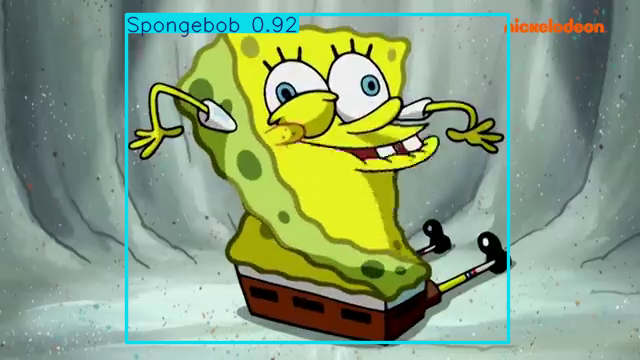


0: 384x640 1 Spongebob, 18.4ms
Speed: 1.5ms preprocess, 18.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


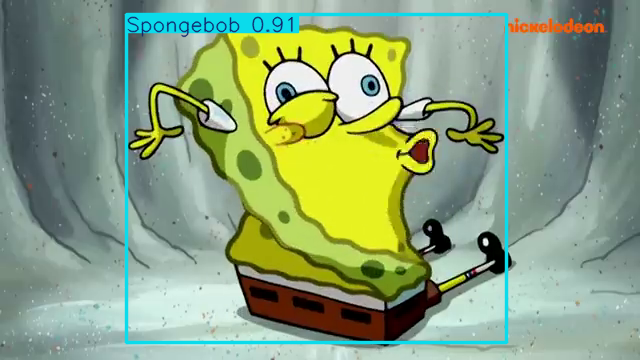


0: 384x640 1 Spongebob, 14.5ms
Speed: 1.4ms preprocess, 14.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


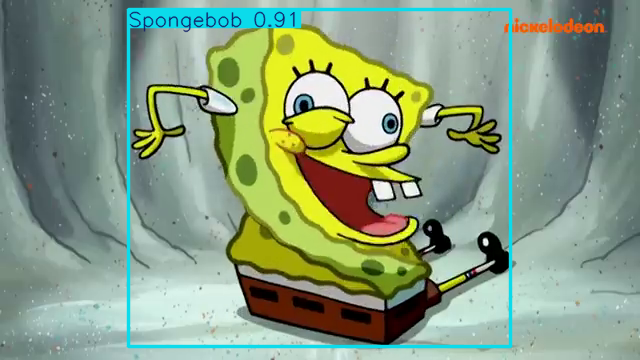


0: 384x640 1 Patric, 17.9ms
Speed: 1.5ms preprocess, 17.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


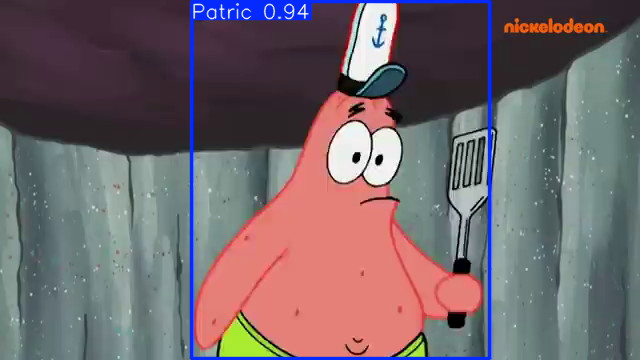


0: 384x640 1 Patric, 1 squidward, 15.5ms
Speed: 1.6ms preprocess, 15.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


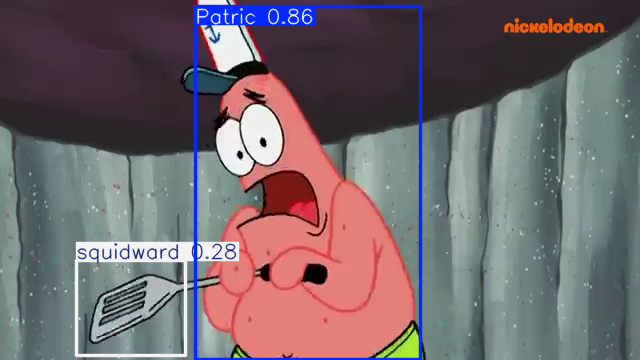


0: 384x640 1 Spongebob, 17.0ms
Speed: 2.4ms preprocess, 17.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


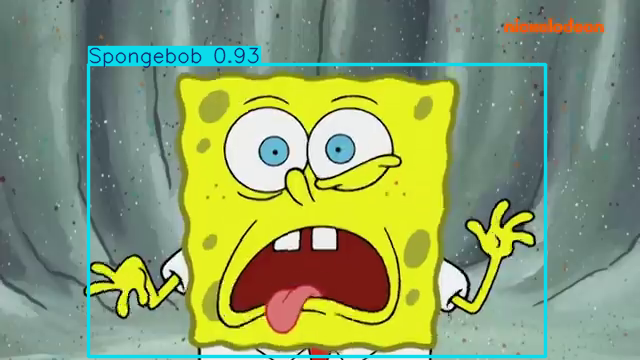


0: 384x640 1 Spongebob, 18.6ms
Speed: 1.5ms preprocess, 18.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


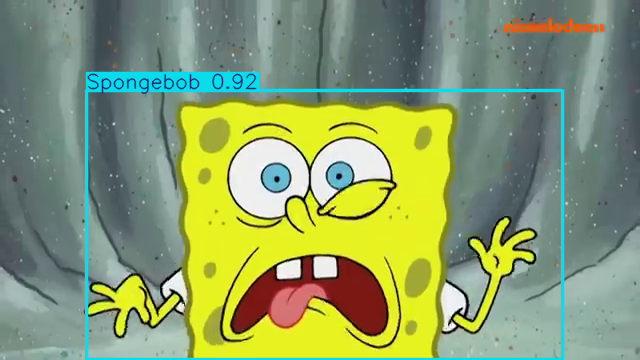


0: 384x640 1 Spongebob, 19.0ms
Speed: 1.8ms preprocess, 19.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


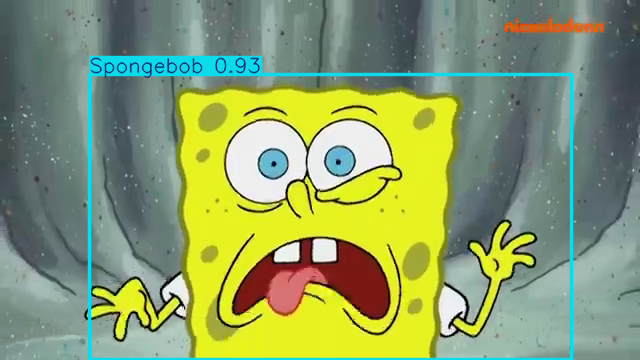


0: 384x640 1 Spongebob, 16.7ms
Speed: 1.7ms preprocess, 16.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


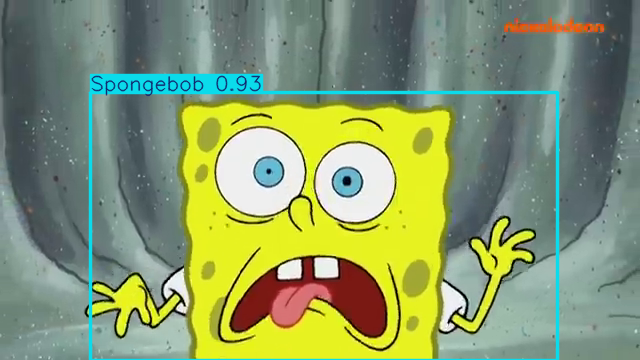


0: 384x640 1 Spongebob, 16.8ms
Speed: 1.7ms preprocess, 16.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


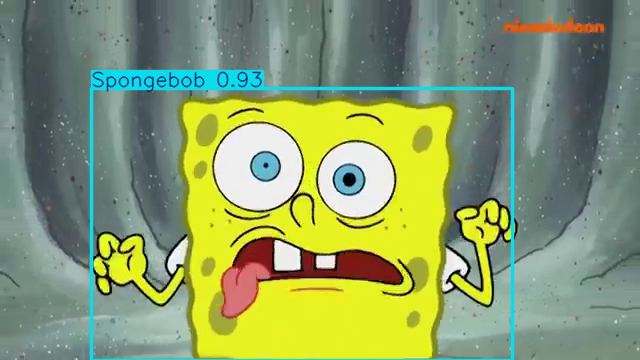


0: 384x640 1 Spongebob, 17.0ms
Speed: 1.7ms preprocess, 17.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


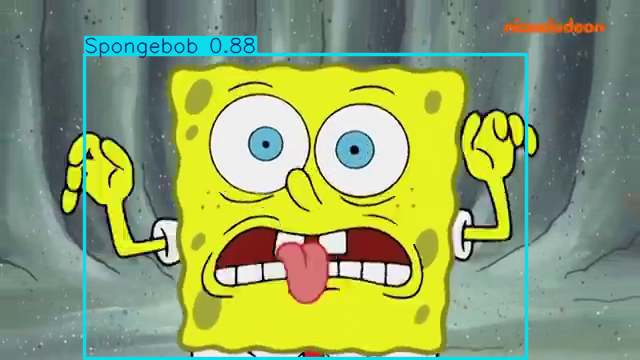


0: 384x640 1 Spongebob, 17.2ms
Speed: 1.5ms preprocess, 17.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


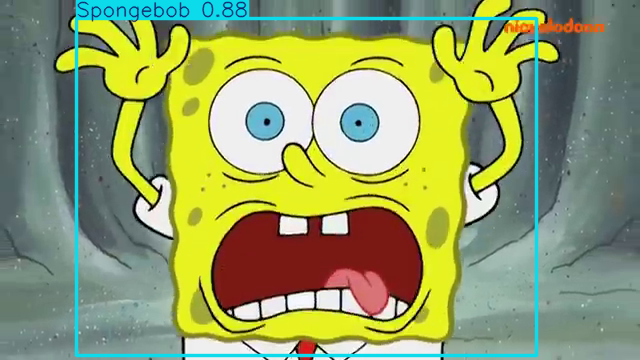


0: 384x640 (no detections), 16.3ms
Speed: 1.6ms preprocess, 16.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


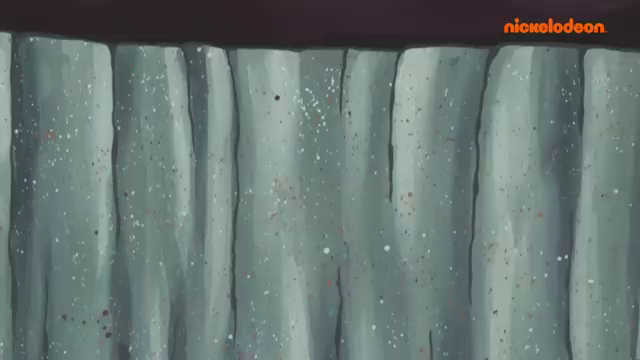


0: 384x640 1 Patric, 21.9ms
Speed: 1.9ms preprocess, 21.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


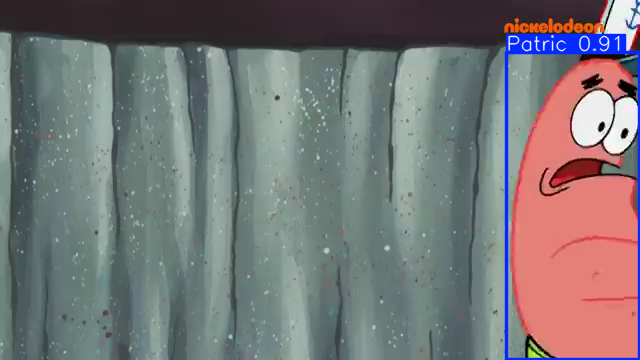


0: 384x640 1 Patric, 18.1ms
Speed: 1.5ms preprocess, 18.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


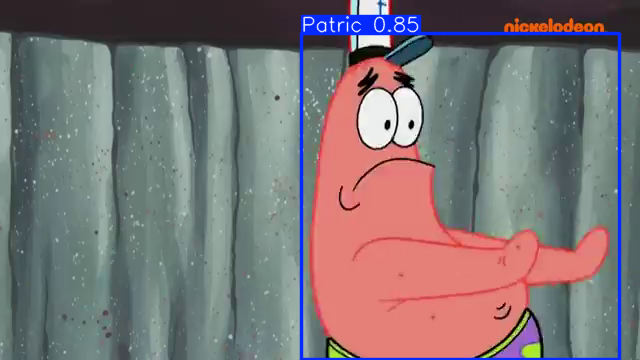


0: 384x640 1 Patric, 17.2ms
Speed: 1.6ms preprocess, 17.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


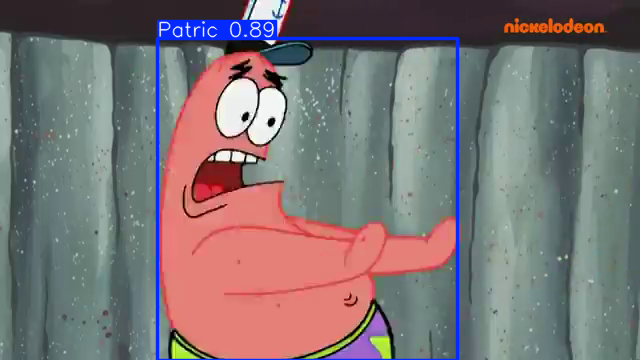


0: 384x640 1 Patric, 19.5ms
Speed: 1.6ms preprocess, 19.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


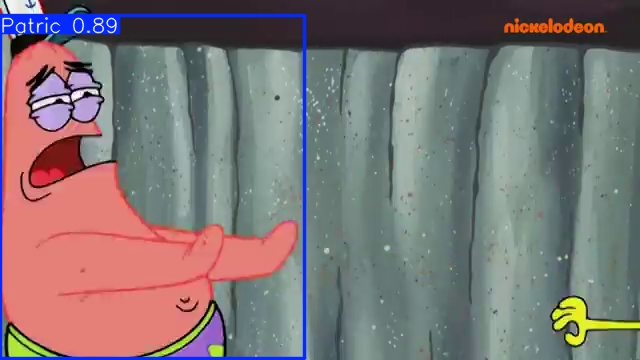


0: 384x640 1 Spongebob, 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


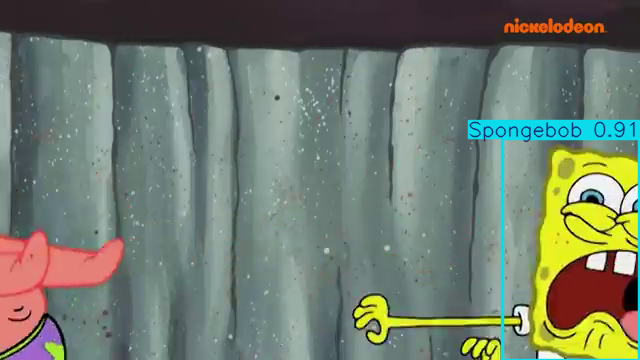


0: 384x640 (no detections), 16.0ms
Speed: 1.5ms preprocess, 16.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


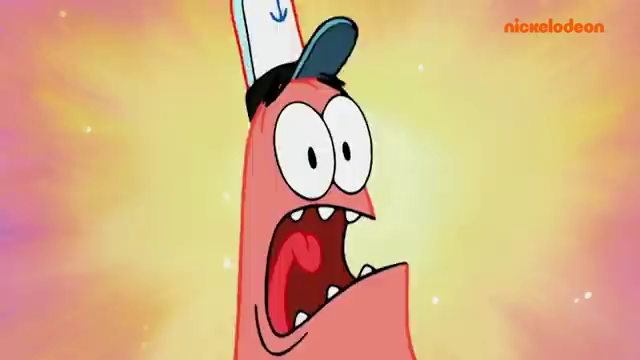


0: 384x640 (no detections), 15.7ms
Speed: 1.6ms preprocess, 15.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


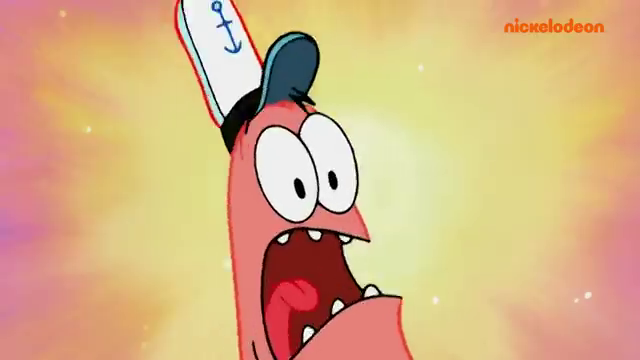


0: 384x640 (no detections), 22.5ms
Speed: 2.2ms preprocess, 22.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


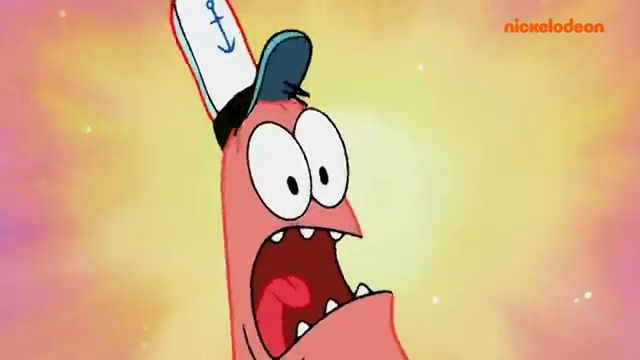


0: 384x640 1 Spongebob, 15.3ms
Speed: 1.5ms preprocess, 15.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


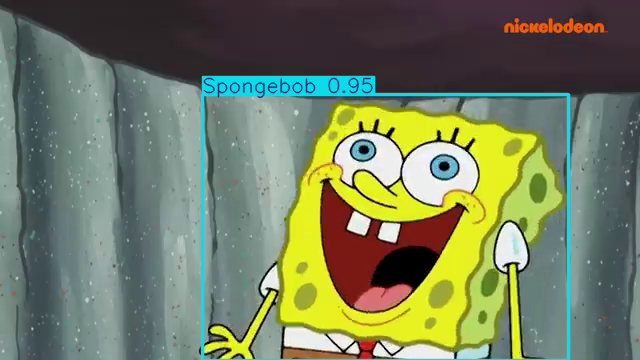


0: 384x640 1 Spongebob, 24.0ms
Speed: 1.5ms preprocess, 24.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


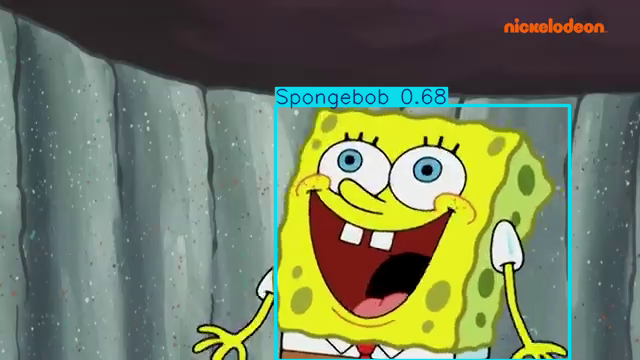


0: 384x640 1 Spongebob, 23.3ms
Speed: 3.3ms preprocess, 23.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


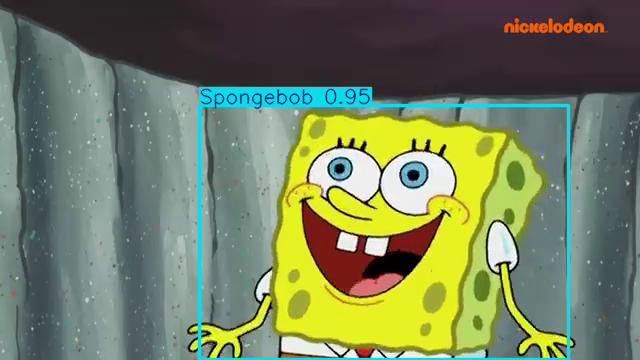


0: 384x640 1 Spongebob, 17.6ms
Speed: 1.7ms preprocess, 17.6ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


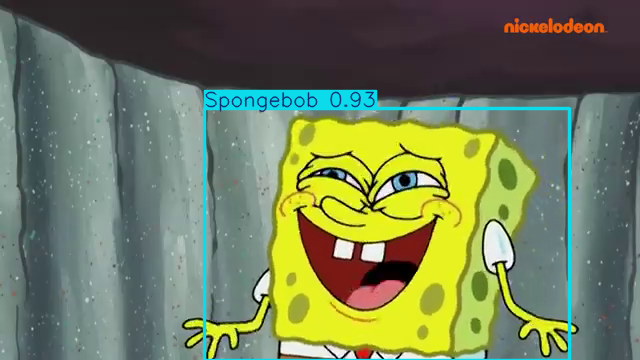


0: 384x640 1 Spongebob, 18.8ms
Speed: 1.5ms preprocess, 18.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


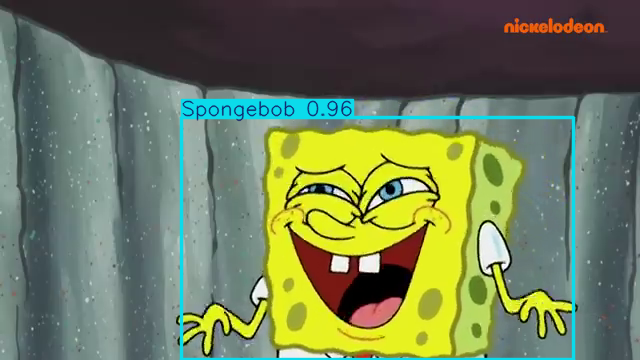


0: 384x640 2 Spongebobs, 15.7ms
Speed: 1.5ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


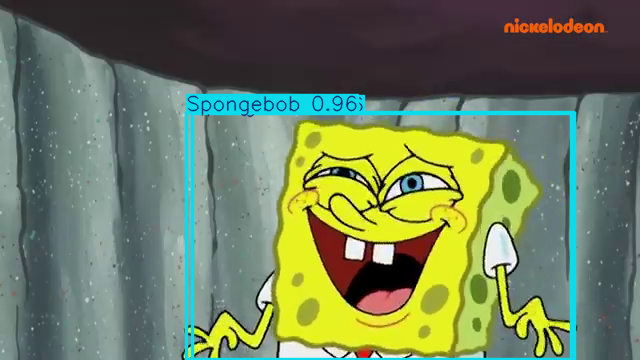


0: 384x640 1 Spongebob, 15.4ms
Speed: 1.6ms preprocess, 15.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


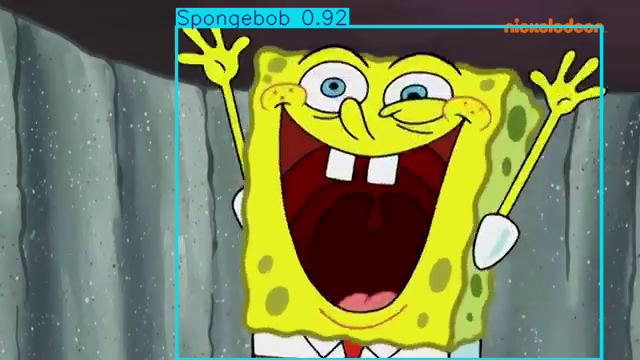


0: 384x640 1 Spongebob, 14.6ms
Speed: 1.6ms preprocess, 14.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


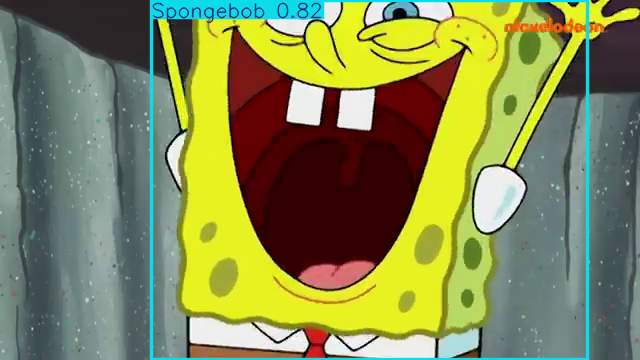


0: 384x640 2 Spongebobs, 15.5ms
Speed: 1.5ms preprocess, 15.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


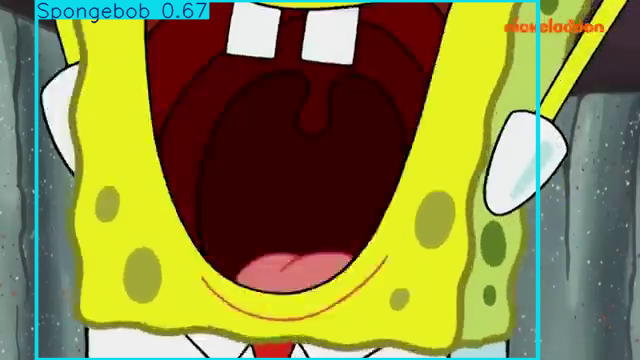


0: 384x640 1 Spongebob, 30.4ms
Speed: 1.5ms preprocess, 30.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


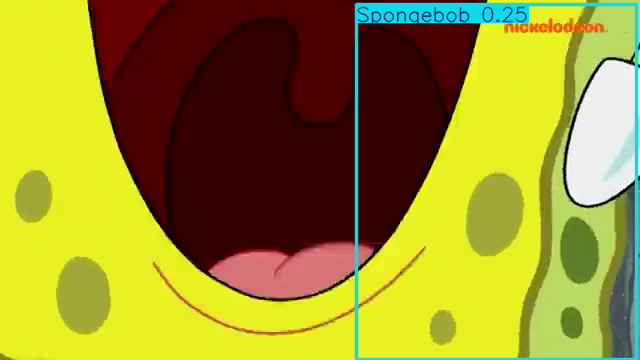


0: 384x640 (no detections), 16.9ms
Speed: 1.5ms preprocess, 16.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


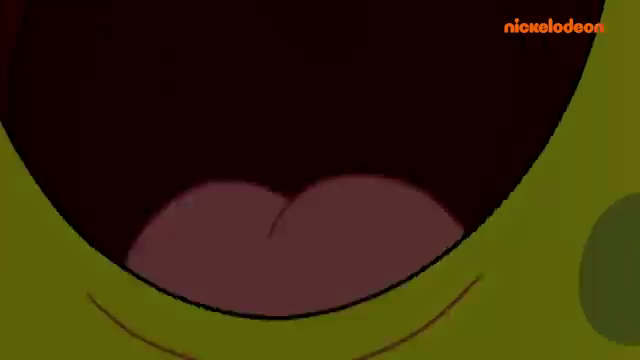


0: 384x640 (no detections), 15.7ms
Speed: 1.4ms preprocess, 15.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


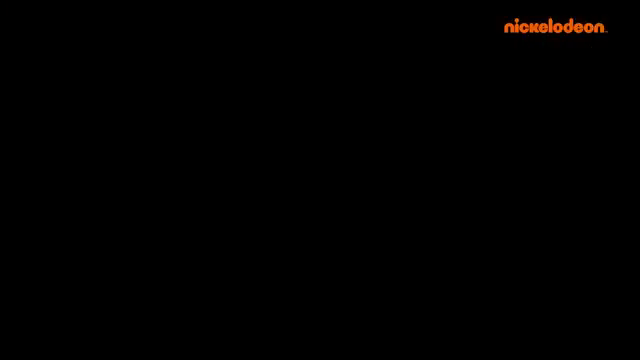


0: 384x640 (no detections), 20.0ms
Speed: 1.6ms preprocess, 20.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


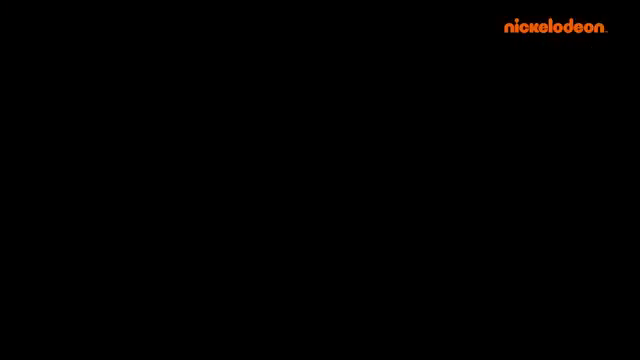


0: 384x640 (no detections), 16.4ms
Speed: 1.4ms preprocess, 16.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


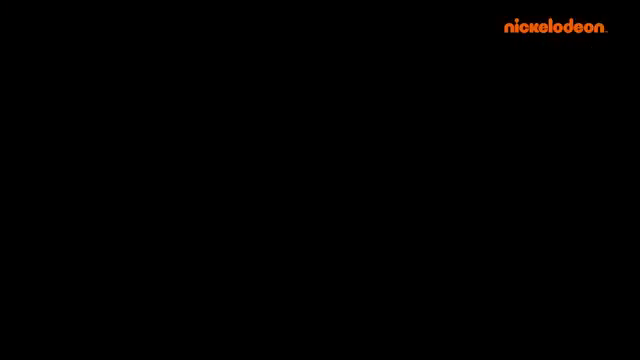


0: 384x640 (no detections), 17.3ms
Speed: 2.6ms preprocess, 17.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


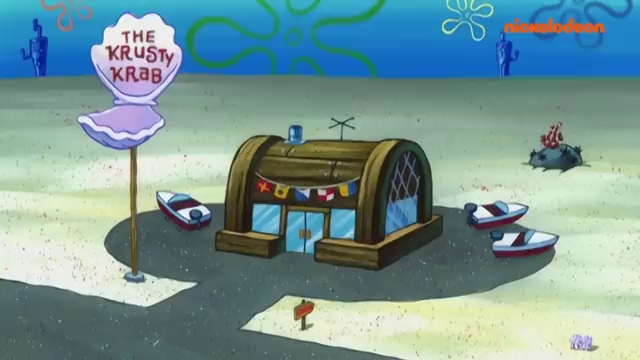


0: 384x640 (no detections), 22.9ms
Speed: 2.0ms preprocess, 22.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


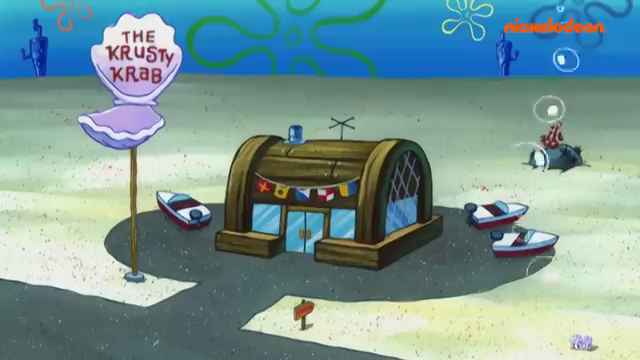


0: 384x640 (no detections), 23.1ms
Speed: 1.7ms preprocess, 23.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


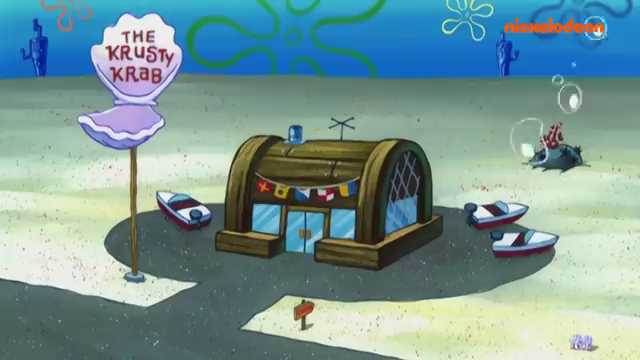


0: 384x640 1 squidward, 23.9ms
Speed: 2.3ms preprocess, 23.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


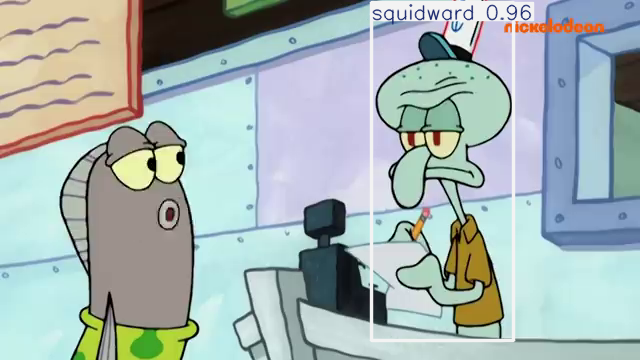


0: 384x640 1 squidward, 34.1ms
Speed: 1.7ms preprocess, 34.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


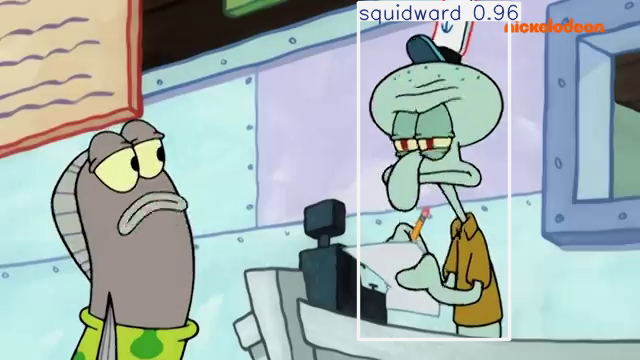


0: 384x640 1 squidward, 31.0ms
Speed: 1.7ms preprocess, 31.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


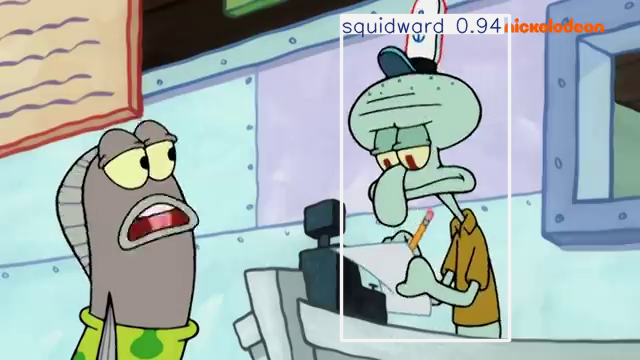


0: 384x640 2 squidwards, 17.7ms
Speed: 1.6ms preprocess, 17.7ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)


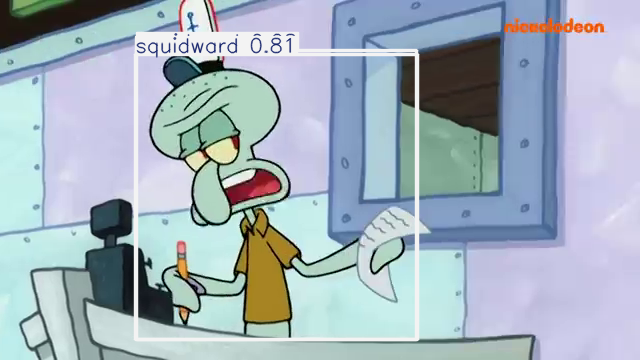


0: 384x640 1 squidward, 22.3ms
Speed: 1.5ms preprocess, 22.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


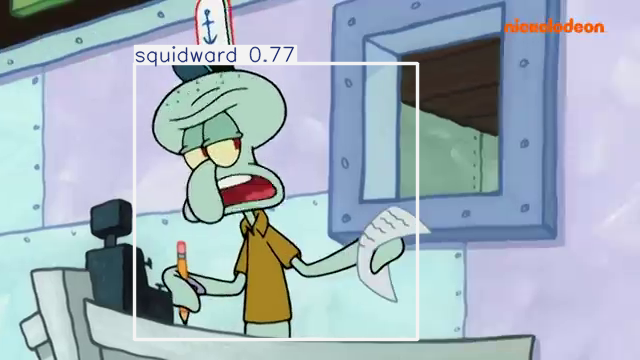


0: 384x640 1 squidward, 20.3ms
Speed: 1.6ms preprocess, 20.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


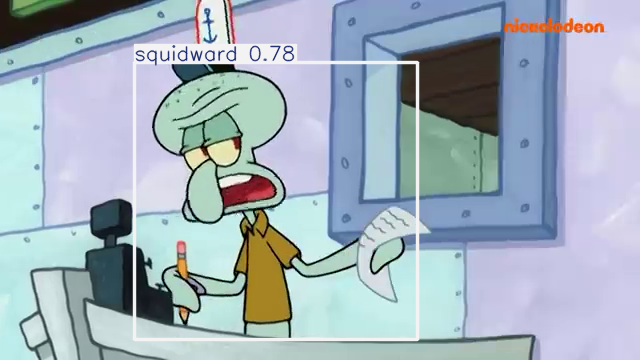


0: 384x640 2 squidwards, 22.1ms
Speed: 1.5ms preprocess, 22.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


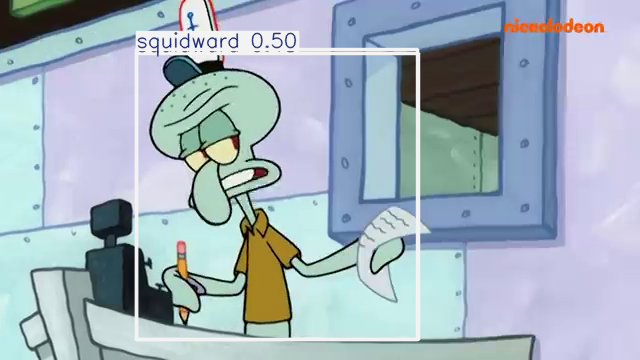

In [54]:
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Process only the selected frames
    if frame_number % frame_interval == 0:
        # Inference on the frame
        results = model(frame)

        # Draw results on the frame
        annotated_frame = results[0].plot()  # Plot the results on the frame

        # Display the annotated frame
        cv2_imshow(annotated_frame)  # Use cv2_imshow for Colab

        # Write the frame to the output video
        out.write(annotated_frame)

    frame_number += 1

# Release everything
cap.release()
out.release()


# download the output video

In [55]:
from google.colab import files
files.download(output_path)  # Download the output video

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>